In [ ]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [ ]:
manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [10]:
batch_size = 128
image_size = 64
number_channels = 3
noise_dim = 100
number_filters_gen = 64
number_filters_disc = 64
lr = 0.0002
beta1 = 0.5
ngpu = 1
num_epochs = 5

In [ ]:
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

In [9]:
dataset = dset.CelebA(root="./data/celeba", split="train", download=True, transform=transform)

In [ ]:
# !unzip data/img_align_celeba.zip -d data/celeba

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [12]:
trainloader = torch.utils.data.DataLoader("./data/celeba", batch_size=batch_size, shuffle=True, num_workers=2)

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [13]:
dataset = dset.ImageFolder(root="data/celeba", transform=transform)

In [14]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

In [15]:
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

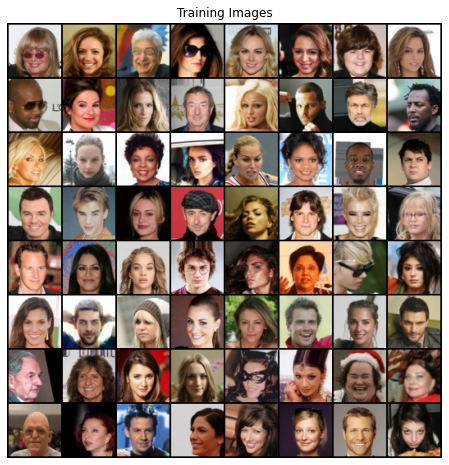

In [16]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(), (1,2,0)))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 63.5, 63.5, -0.5)

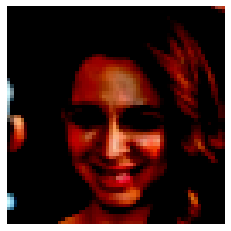

In [17]:
plt.imshow(np.transpose(real_batch[0][5], (1, 2, 0)))
plt.axis("off")

In [18]:
(np.transpose(real_batch[0][1])).shape

torch.Size([64, 64, 3])

In [19]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [20]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(noise_dim, number_filters_gen * 8, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(number_filters_gen * 8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(number_filters_gen * 8, number_filters_gen * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(number_filters_gen * 4),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(number_filters_gen * 4, number_filters_gen * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(number_filters_gen * 2),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(number_filters_gen * 2, number_filters_gen, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(number_filters_gen),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(number_filters_gen, number_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )
        
    def forward(self, input):
        return self.main(input)

In [21]:
netG = Generator(ngpu).to(device)

if (device.type == "cuda") and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
    
netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [22]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        
        self.ngpu = ngpu
        self.main = nn.Sequential(
            
            nn.Conv2d(number_channels, number_filters_disc, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(number_filters_disc, number_filters_disc * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(number_filters_disc * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(number_filters_disc * 2, number_filters_disc * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(number_filters_disc * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(number_filters_disc * 4, number_filters_disc * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(number_filters_disc * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(number_filters_disc * 8, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )
    
    def forward(self, input):
        return self.main(input)

In [23]:
netD = Discriminator(ngpu).to(device)

if (device.type == "cuda") and (ngpu > 1):
    netD = nn.DataParallel(netG, list(range(ngpu)))
    
netD.apply(weights_init)

print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [26]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, noise_dim, 1, 1, device=device)

real_label = 1
fake_label = 0

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))

In [27]:
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop....")

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        
        netD.zero_grad()
        
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        
        
        noise = torch.randn(b_size, noise_dim, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        errD = errD_real + errD_fake
        optimizerD.step()
        
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        
        if i % 50 == 0 :
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop....
[0/5][0/1583]	Loss_D: 1.7912	Loss_G: 2.1064	D(x): 0.2994	D(G(z)): 0.2525 / 0.1659
[0/5][50/1583]	Loss_D: 0.6967	Loss_G: 3.0678	D(x): 0.9944	D(G(z)): 0.4768 / 0.0526
[0/5][100/1583]	Loss_D: 0.6450	Loss_G: 2.6867	D(x): 0.9946	D(G(z)): 0.4558 / 0.0742
[0/5][150/1583]	Loss_D: 0.6505	Loss_G: 2.4457	D(x): 0.9953	D(G(z)): 0.4627 / 0.0924
[0/5][200/1583]	Loss_D: 0.5963	Loss_G: 2.3257	D(x): 0.9975	D(G(z)): 0.4377 / 0.1038
[0/5][250/1583]	Loss_D: 0.5976	Loss_G: 2.2273	D(x): 0.9982	D(G(z)): 0.4401 / 0.1131
[0/5][300/1583]	Loss_D: 0.5578	Loss_G: 2.1788	D(x): 0.9977	D(G(z)): 0.4196 / 0.1176
[0/5][350/1583]	Loss_D: 0.5678	Loss_G: 2.0755	D(x): 0.9980	D(G(z)): 0.4237 / 0.1321
[0/5][400/1583]	Loss_D: 0.5480	Loss_G: 2.0412	D(x): 0.9980	D(G(z)): 0.4139 / 0.1347
[0/5][450/1583]	Loss_D: 0.5744	Loss_G: 1.8778	D(x): 0.9990	D(G(z)): 0.4286 / 0.1613
[0/5][500/1583]	Loss_D: 0.5212	Loss_G: 1.7416	D(x): 0.9991	D(G(z)): 0.4006 / 0.1822
[0/5][550/1583]	Loss_D: 0.5097	Loss_G: 1.6293	D(x): 

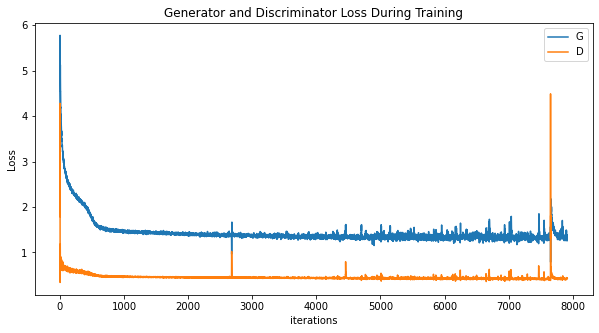

In [28]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

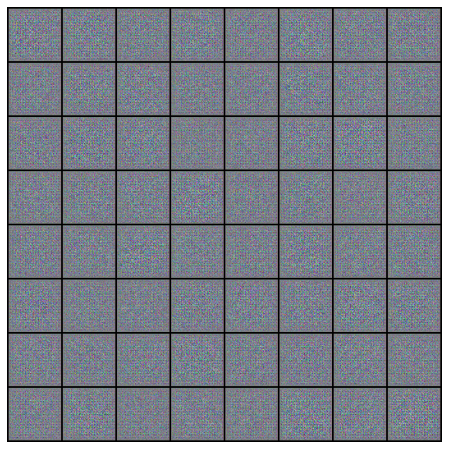

In [29]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

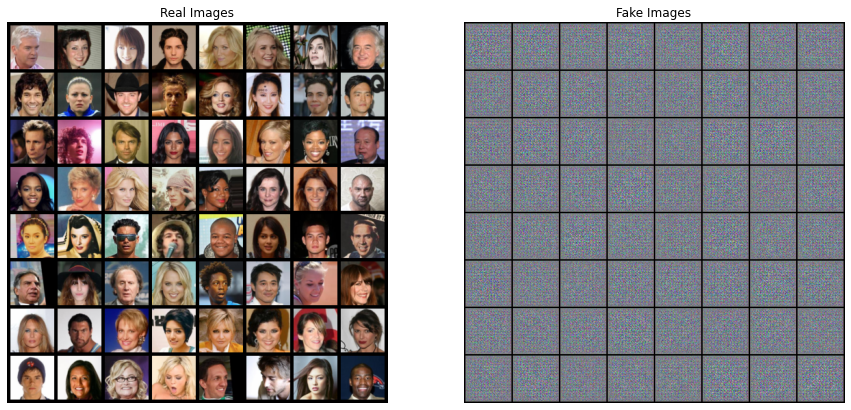

In [30]:
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()